# Analisis exploratorio sobre la contaminación de los taxis en NY

### Importamos las librerías que utilizaremos

In [144]:
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

### Importación de csv

In [145]:
df_taxis = pd.read_csv("data/Informacion de taxis.csv")
df_sonidos = pd.read_csv("data/sonidos_NY.csv")
df_air = pd.read_csv("data/boroughs_air_quality.csv")

## Comenzamos a evaluar el Co2

In [146]:
df_taxis['co2'].describe()

count    46169.000000
mean       120.104811
std        194.612428
min         -1.000000
25%         -1.000000
50%         -1.000000
75%        311.000000
max        979.000000
Name: co2, dtype: float64

* count: Este valor indica la cantidad total filas de la variable "co2".

* mean: La "mean" o "media" es el valor promedio de la variable "co2". En este caso, la media es 120.105.

* std: La "std" o "desviación estándar" es una medida de dispersión que indica cuánto varían los valores de "co2" con respecto a la media. En este caso, la desviación estándar es aproximadamente 194.612. Una desviación estándar alta sugiere una mayor variabilidad en los valores de "co2".

* min: El "min" o "mínimo" es el valor más pequeño de "co2" en tu conjunto de datos. En este caso, el valor mínimo es -1.0.

* 25%: Este valor representa el percentil 25 (o primer cuartil) de los datos. En otras palabras, el 25% de los valores de "co2" son iguales o inferiores a este valor. En este caso, el 25% de los valores de "co2" son iguales o inferiores a -1.0.

* 50%: Este valor representa la mediana, que es el valor que se encuentra en el centro del conjunto de datos cuando los valores están ordenados en orden ascendente. En este caso, la mediana es -1.0.

* 75%: Este valor representa el percentil 75 (o tercer cuartil) de los datos. El 75% de los valores de "co2" son iguales o inferiores a este valor. En este caso, el 75% de los valores de "co2" son iguales o inferiores a 311.0.

* max: el valor máximo es 979.0.

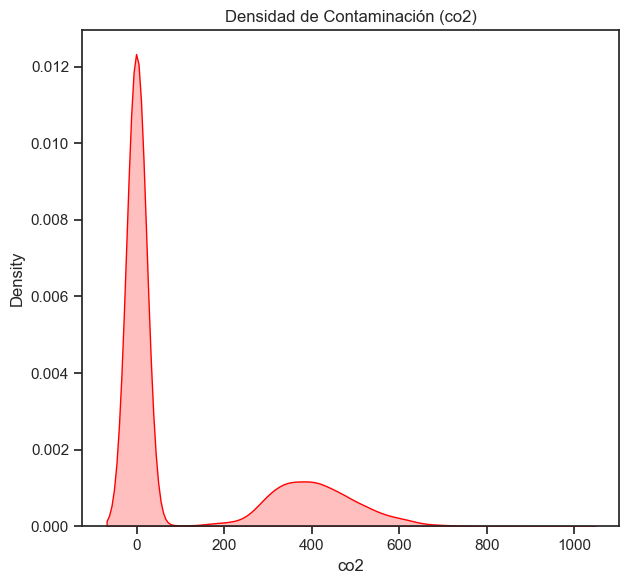

In [147]:
# Crear un subplot con gráfico de densidad
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 2)  #gráfico de densidad para 'co2'
sns.kdeplot(df_taxis['co2'], shade=True, color='red')
plt.title('Densidad de Contaminación (co2)')

plt.tight_layout()
plt.show()

La densidad contiene un pico principal en el eje X alrededor de 0 con una densidad máxima de 0.012. Después de este pico, hay una distribución bimodal en el rango del eje X desde 200 hasta 600,  alcanzando una densidad máxima de 0.001. Esto significa que en el rango de 200 a 600 en el eje X, hay valores que tienen una densidad más baja en comparación con el pico principal en 0. Además, la distribución es asimétrica, ya que hay una concentración significativamente más alta de valores en el rango de 0 en comparación con los rangos de 200 a 600.

### Emisión de CO2  en función al año de fabricación de los taxis

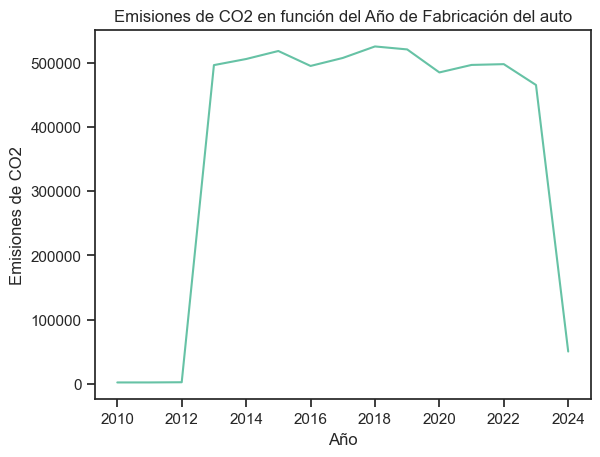

In [148]:
# Filtrar datos desde el año 2010
df_emissions = df_taxis[df_taxis['Year'] >= 2010]

# Calcular la suma de las emisiones de CO2 por año
df_emissions = df_emissions.groupby('Year')['co2'].sum()

# Crear el gráfico de línea
plt.plot(df_emissions.index, df_emissions.values)
plt.xlabel('Año')
plt.ylabel('Emisiones de CO2')
plt.title('Emisiones de CO2 en función del Año de Fabricación del auto')
plt.show()

Podemos ver que hay un valor muy presente de CO2 ocasionado por los autos utilizados y que varía muy poco, más que nada desde el 2020 se puede observar que tiende a disminuir pero siguen siendo autos con valores altos de contaminación.

## Relación entre emisiones de CO2 y tipo de combustible

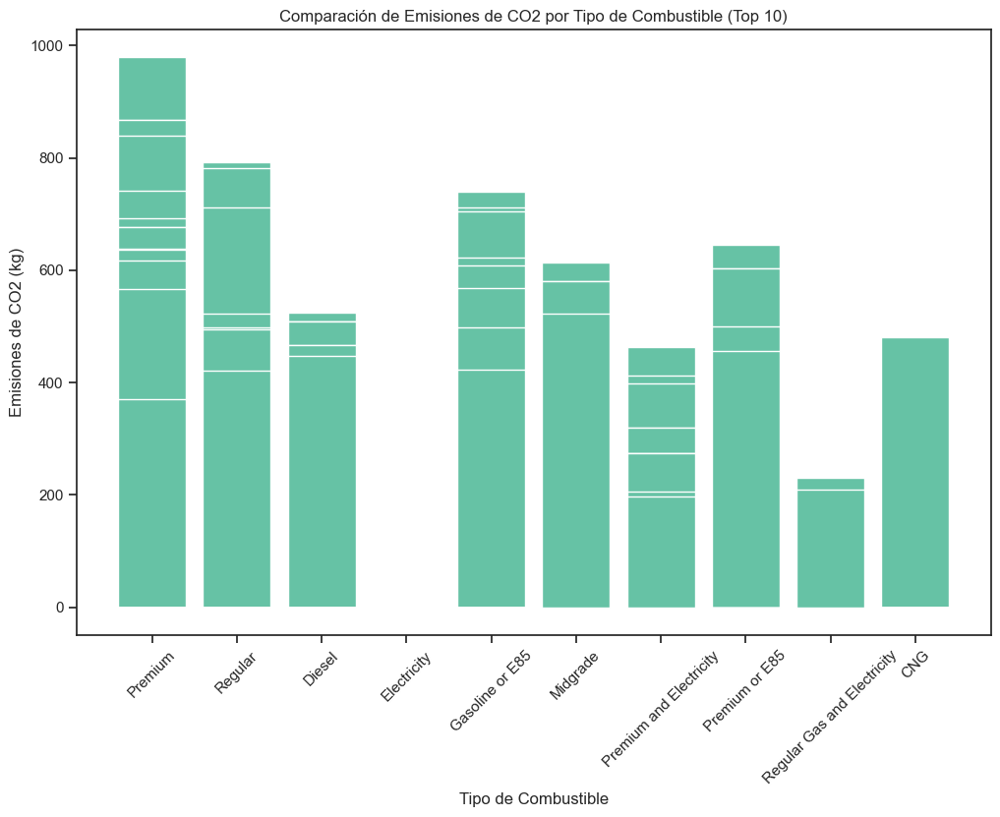

In [149]:
# Configura la paleta de colores de Seaborn
sns.set_palette("Set2")
# Obtener los 10 tipos de combustible más comunes
top_10_fuel_types = df_taxis['fuelType'].value_counts().head(10).index

# Filtrar los datos para incluir solo los 10 tipos de combustible más comunes
df_top_10_fuel = df_taxis[df_taxis['fuelType'].isin(top_10_fuel_types)]

# Crear un gráfico de barras para comparar emisiones de CO2 por tipo de combustible (Top 10)
plt.figure(figsize=(12, 8))
plt.bar(df_top_10_fuel["fuelType"], df_top_10_fuel["co2"])
plt.xlabel("Tipo de Combustible")
plt.ylabel("Emisiones de CO2 (kg)")
plt.title("Comparación de Emisiones de CO2 por Tipo de Combustible (Top 10)")
plt.xticks(rotation=45)
plt.show() 

* El tipo de combustible que más emite dióxido de carbono es el Premium, utilizado mayormente por autos de alta gama. 
* Podemos ver que la mejor alternativa es utilizar autos eléctricos ya que no emiten CO2, o también, para disminuirlo, la utilización de combinar eléctrico con combustible es otra buena alternativa.

### Costos del combustible

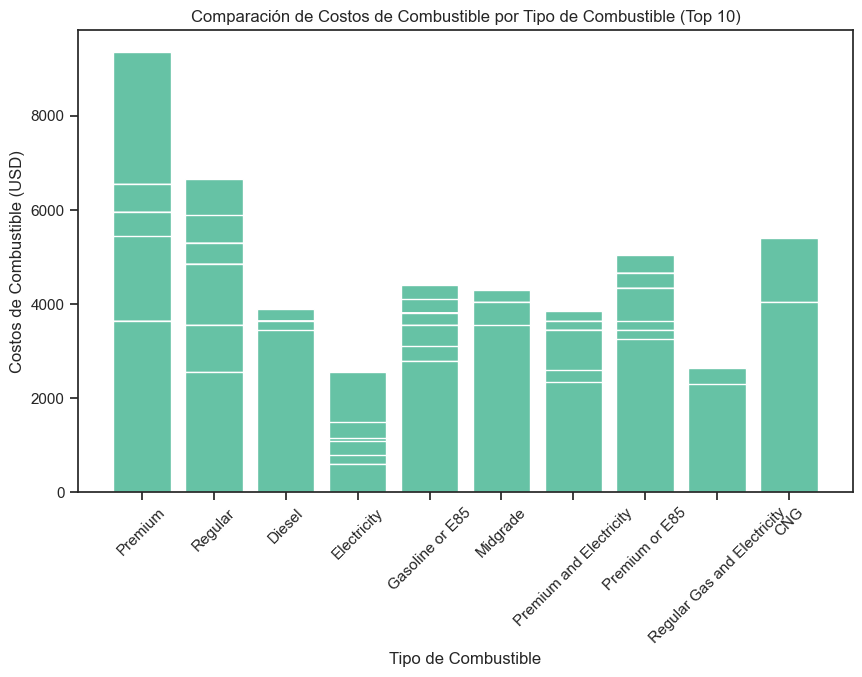

In [150]:
# Obtener los 10 tipos de combustible más comunes
top_10_fuel_types = df_taxis['fuelType'].value_counts().head(10).index

# Filtrar los datos para incluir solo los 10 tipos de combustible más comunes
df_top_10_fuel = df_taxis[df_taxis['fuelType'].isin(top_10_fuel_types)]

# Crear un gráfico de barras para comparar costos de combustible por tipo de vehículo
plt.figure(figsize=(10, 6))
plt.bar(df_top_10_fuel['fuelType'], df_top_10_fuel['fuelCost08'])
plt.xlabel('Tipo de Combustible')
plt.ylabel('Costos de Combustible (USD)')
plt.title('Comparación de Costos de Combustible por Tipo de Combustible (Top 10)')
plt.xticks(rotation=45)
plt.show()



Premium resulta ser el combustible más costoso mientras que los autos  eléctricos  junto con el combinado de gas regular y eléctrico son los más económicos.

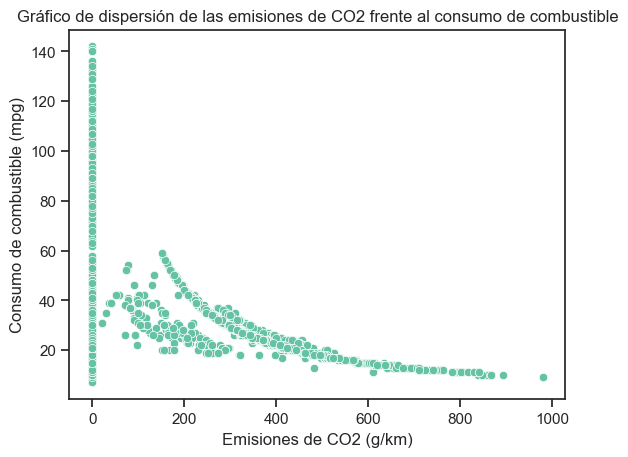

In [151]:
# Filtra el dataframe para obtener solo las columnas necesarias
df_taxis_disp = df_taxis[['co2', 'comb08']]

# Crea el gráfico de dispersión
sns.scatterplot(x=df_taxis_disp['co2'], y=df_taxis_disp['comb08'])

# Agrega etiquetas a los ejes y al título
plt.xlabel('Emisiones de CO2 (g/km)')
plt.ylabel('Consumo de combustible (mpg)')
plt.title('Gráfico de dispersión de las emisiones de CO2 frente al consumo de combustible')

# Muestra el gráfico
plt.show()

Existe una relación que no es lineal entre las emisiones de CO2 y el consumo de combustible, teniendo como mayor cantidad de emisiones dispersas cuando hay menor consumo.

## Contaminación en el aire

In [152]:
merged_df = pd.merge(df_taxis, df_air, on='Unnamed: 0', how='inner')

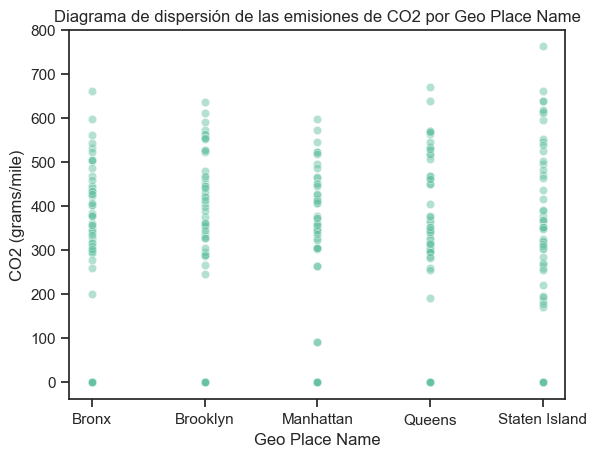

In [153]:
# Filtra el dataframe para obtener solo las columnas necesarias
df_filtered = merged_df[['Geo Place Name', 'co2']]

# Crea el diagrama de dispersión sin leyenda
sns.scatterplot(
    x='Geo Place Name',
    y='co2',
    data=df_filtered,
    alpha=0.5,
)

# Agrega etiquetas a los ejes y al título
plt.xlabel('Geo Place Name')
plt.ylabel('CO2 (grams/mile)')
plt.title('Diagrama de dispersión de las emisiones de CO2 por Geo Place Name')

# Muestra el gráfico
plt.show()

## Contaminación sonora

In [154]:
df_sonidos['1_engine_presence'].describe()

count    62022.000000
mean         0.234562
std          0.544790
min         -1.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: 1_engine_presence, dtype: float64

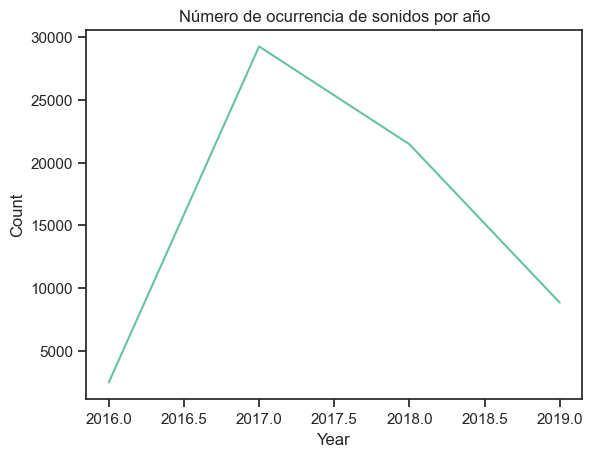

In [155]:
# Agrupa los datos por año y cuenta el número de ocurrencias en cada año
year_counts = df_sonidos['year'].value_counts().sort_index()

# Crea el gráfico de líneas
plt.plot(year_counts.index, year_counts.values)

# Personaliza el gráfico
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Número de ocurrencia de sonidos por año')

# Muestra el gráfico
plt.show()

Como el pico más alto en ocurrencias de sonidos en Nueva York tenemos aproximadamente 2017 y luego se puede apreciar una inclinación con cada vez menor cantidad hasta 2019

#### Presencia de sonido de motor por zona

<Figure size 1000x600 with 0 Axes>

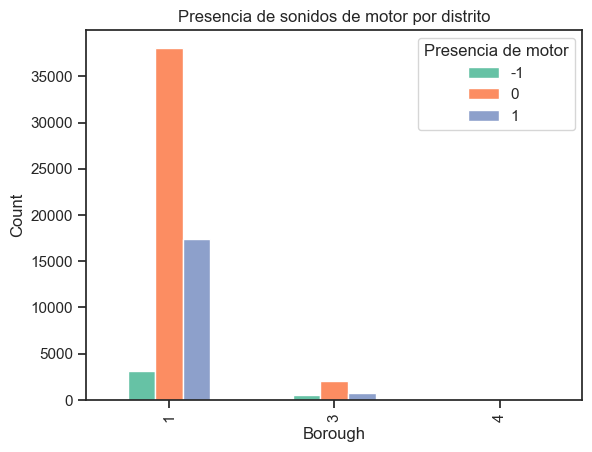

In [156]:

plt.figure(figsize=(10, 6))
df_sonidos.groupby('borough')['1_engine_presence'].value_counts().unstack().plot(kind='bar')
plt.xlabel('Borough')
plt.ylabel('Count')
plt.title('Presencia de sonidos de motor por distrito')
plt.legend(title='Presencia de motor')
plt.show()

El distrito con mayor ocurrencia de sonidos causados por actividad de motor es en el distrito 1 correspondiente a Manhattan con una presencia de más de 15000 observaciones, pero además tiene 35000 con valor de presencia de motor igual a 0, reportando la ausencia de sonidos de motor en el distrito de Manhattan. También tiene presencia es el distrito 3 el cuál es Queens.
Además se puede apreciar que en su mayoría no hay muchos sonidos ocasionados por el motor de los autos.

### Visualización del mapa de NY con relación a los sonidos ocacionados por motor

In [157]:
import folium

mapa = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

for i in range(len(df_sonidos)):
    if df_sonidos["1_engine_presence"].iloc[i] == 1:
        folium.CircleMarker([df_sonidos["latitude"].iloc[i], df_sonidos["longitude"].iloc[i]], radius=5, color="red").add_to(mapa)

mapa.save("mapa.html")

In [158]:
mapa

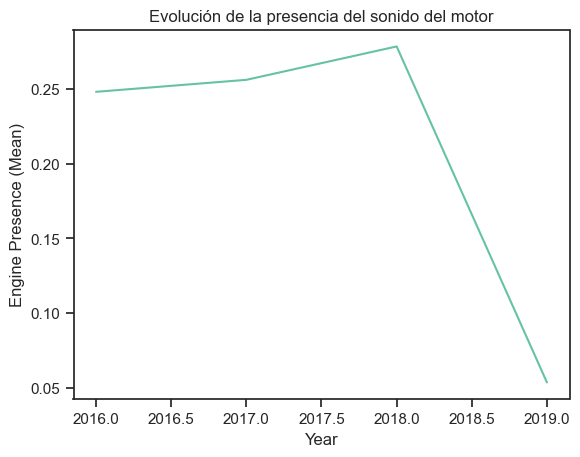

In [159]:
yearly_mean = df_sonidos.groupby('year')['1_engine_presence'].mean()

plt.plot(yearly_mean.index, yearly_mean.values)
plt.xlabel('Year')
plt.ylabel('Engine Presence (Mean)')
plt.title('Evolución de la presencia del sonido del motor')
plt.show()

Se puede observar que la media de sonidos de motor por año tiene una variación pequeña manteniendose desde 0.25 a 0.28, siendo el pico más pronunciado en 2018.

## Conclusiones

Se ha evidenciado que una parte significativa de la flota de vehículos en Nueva York genera niveles sustanciales de CO2. Esta observación subraya la urgencia de abordar la contaminación del aire en la ciudad.
Al comparar diferentes alternativas, se destaca la viabilidad y beneficios de incorporar más vehículos eléctricos, ya que no solo son más respetuosos con el medio ambiente al no emitir CO2, sino que también resultan más económicos en términos de costos de combustible. Esta transición hacia una flota de vehículos más limpia y eficiente puede contribuir a una mejora significativa de la calidad del aire en Nueva York.

En general, la mayoría de los distritos muestran una ausencia de sonidos de motor en la mayoría de las observaciones, lo que sugiere que la ciudad de Nueva York puede beneficiarse de medidas para reducir la contaminación sonora en áreas específicas, como lo es Manhattan donde si se genera contaminación sonora.

Estos hallazgos respaldan la importancia de adoptar tecnologías más limpias y sostenibles en el transporte y de implementar políticas que reduzcan la contaminación del aire y la contaminación sonora en áreas urbanas densamente pobladas como Nueva York. La toma de decisiones informadas y la acción proactiva son esenciales para abordar estos desafíos ambientales y mejorar la calidad de vida de los residentes de la ciudad.